In [21]:
import tensorflow as tf
import tensorflow_datasets  as tfds
from tensorflow.keras.callbacks import TensorBoard

import numpy as np

import matplotlib.pyplot as plt

import cv2 #libreria para igualar el tamaño de las imagenes
#Descargamos el dataset 
datos,metadatos = tfds.load('cats_vs_dogs',as_supervised=True,with_info=True)

#Mostrando datos


,image,label
0,,1 (dog)
1,,1 (dog)
2,,1 (dog)
3,,0 (cat)
4,,1 (dog)

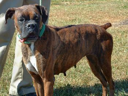
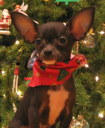
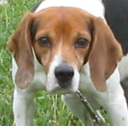
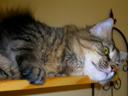
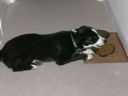

In [3]:
tfds.as_dataframe(datos['train'].take(5),metadatos)

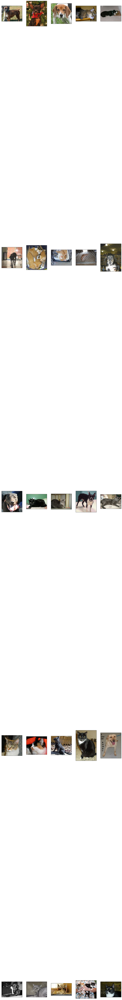

In [4]:
plt.figure(figsize=(15,151))

for i, (imagen,etiqueta) in enumerate(datos['train'].take(25)):
  plt.subplot(5,5,i+1) #5filas 5 columnas
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen)

#Adaptando las imagenes 

___

Se pasan las imagenes a blanco y negro, y se reduce el tamaño de cada imagen para minimizar el tiempo de procesamiento

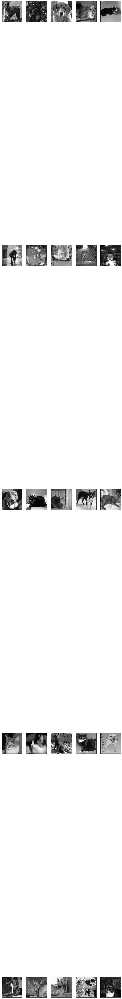

In [8]:
plt.figure(figsize=(15,151))
size=100 #Tamaño de la imagen
for i, (imagen,etiqueta) in enumerate(datos['train'].take(25)):
  
  imagen=cv2.resize(imagen.numpy(),(size,size)) #aca se cambia el tamaño
  imagen=cv2.cvtColor(imagen,cv2.COLOR_BGR2GRAY)#aca se cambia el color

  plt.subplot(5,5,i+1) #5filas 5 columnas
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen,cmap='gray')

#Entrenando

##Creando el conjunto de datos para el entrenamiento

In [10]:
traindata = []

for i,(imagen,etiqueta) in enumerate(datos['train']):
  imagen = cv2.resize(imagen.numpy(),(size,size))
  imagen = cv2.cvtColor(imagen,cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(size,size,1) #Para que sepa que solo se tomara el canal de color de grises
  traindata.append([imagen,etiqueta])

print("[!] Hecho !")  

##Separando los datos de entrenamiento

In [12]:
x=[]
y=[]

for imagen,etiqueta in traindata:
  x.append(imagen)
  y.append(etiqueta)

print("[!] Datos separados !")  

[!] Datos separados !


##Normalizando el valor de los colores de la imagen

___

Como los colores representados en los pixeles de las imágenes están en un rango de 0 a 255 es necesario normalizarlos para que se encuentren entre 0 y 1. Para ello utilizamos la librería numpy, convertimos los datos a float y dividimos entre 255 cada valor

In [13]:
x =np.array(x).astype(float)/255

También convertimos las salidas en un arreglo con numpy, así los datos estarán en un formato simple que indicarán solo 1 o 0, según si es perro o gato

In [14]:
y = np.array(y)
y

array([1, 1, 1, ..., 0, 1, 0])

##Creando el modelo

___
Una red neuronal con una capa de entrada, dos capas ocultas de 150 neuronas cada
una y una capa de salida

In [18]:
modeloDenso = tf.keras.models.Sequential([
      tf.keras.layers.Flatten(input_shape = (100,100,1)),
      tf.keras.layers.Dense(150, activation='relu'),
      tf.keras.layers.Dense(150, activation='relu'),
      tf.keras.layers.Dense(1, activation='sigmoid')
])
print("[!] Hecho !")  

[!] Hecho !


##Compilamos el modelo

In [23]:
modeloDenso.compile(tf.keras.optimizers.Adam(0.1),
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

print("[!] Hecho !")  

[!] Hecho !


##Entrenamos el modelo

___

El parámetro de validation_split, indica el porcentaje de datos que se tomará para las pruebas

In [32]:
tensorboardDenso = TensorBoard(log_dir='logs/denso')
trained = modeloDenso.fit(x,y,validation_split=0.15,epochs=100, callbacks=[tensorboardDenso],verbose = False)
print("[!] Modelo entrenado!")  

[!] Modelo entrenado!


##Graficamos la perdida

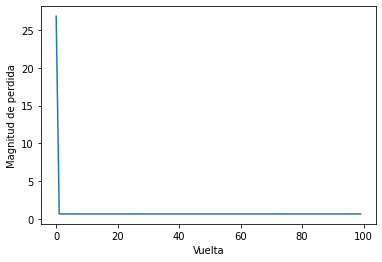

In [25]:
plt.xlabel("Vuelta")
plt.ylabel("Magnitud de perdida")
plt.plot(trained.history["loss"])

##Graficamos con colab

In [ ]:
!pip install tensorboard

In [42]:
 #Cargamos la extension de tensorboard de colab
 %load_ext tensorboard 

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [45]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>